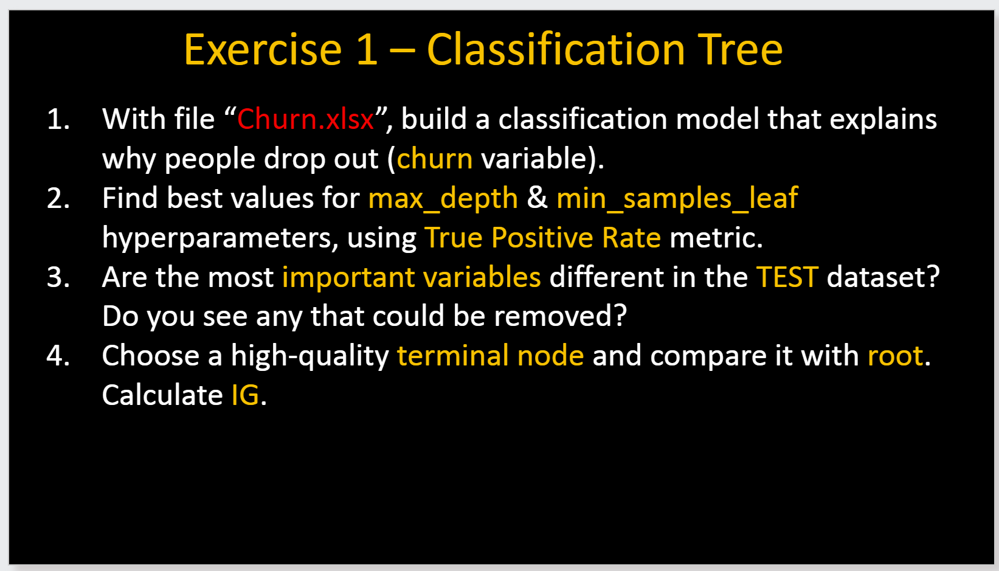

In [68]:
from IPython.display import display, HTML, Markdown

display(HTML("<style>.container { width:100% !important; }</style>")) # Increase cell width
display(HTML("<style>.rendered_html { font-size: 16px; }</style>")) # Increase font size

# Larger figures
import matplotlib.pyplot as plt
%matplotlib inline  

import warnings
import pandas as pd
import numpy as np
import seaborn as sns

from sklearn.metrics import auc, roc_curve, f1_score, accuracy_score, precision_recall_curve, confusion_matrix, classification_report
from sklearn.metrics import recall_score, precision_score
from sklearn import metrics
from sklearn.metrics import precision_recall_fscore_support
from sklearn.model_selection import cross_val_score

In [69]:
legend = pd.read_excel('../DATA/Churn.xlsx', 1)
legend_md = legend.to_markdown(index=False)

display(Markdown(legend_md))

| id             | Customer Id                                |
|:---------------|:-------------------------------------------|
| longdist       | Minutes in Long Distance Calls             |
| internat       | Minutes in International Calls             |
| local          | Minutes in Local Calls                     |
| int_disc       | International Discount (0=No, 1=Yes)       |
| billtype       | Type of Local Bill (0=FreeLocal, 1=Budget) |
| age            | Age                                        |
| gender         | Gender (0=Male, 1=Female)                  |
| marital        | Marital Status (0=Single, 1=Married)       |
| children       | Number of Children                         |
| est_inco       | Estimated Income                           |
| car            | Own a car (0=No, 1=Yes)                    |
| pay_Bank       | Pay - Bank account (0=No, 1=Yes)           |
| pay_CreditCard | Pay - with Credit Card (0=No, 1=Yes)       |
| pay_Cash       | Pay - in Cash (0=No, 1=Yes)                |
| churn          | Churn (0=Stay, 1=Leave)                    |

In [70]:
df = pd.read_excel('../DATA/Churn.xlsx', 0)
df.head(3)

,id,longdist,internat,local,int_disc,billtype,age,gender,marital,children,est_inco,car,pay_Bank,pay_CreditCard,pay_Cash,churn
0,1,27.0936,0.0,39.7357,0,1,35,1,1,0,77680.0,0,0,1,0,0
1,2,10.0427,0.0,46.3118,0,0,53,0,0,1,37111.5,1,1,0,0,0
2,3,23.7605,0.0,68.3512,1,1,65,1,1,1,37079.4,0,1,0,0,0


In [71]:
df['local'].nunique()

1476

In [72]:
df.isnull().sum()

id                0
longdist          0
internat          0
local             0
int_disc          0
billtype          0
age               0
gender            0
marital           0
children          0
est_inco          0
car               0
pay_Bank          0
pay_CreditCard    0
pay_Cash          0
churn             0
dtype: int64

In [73]:
df.drop(columns=['longdist', 'local', 'internat', 'est_inco'], inplace = True)

In [74]:
from collections import Counter

def class_perc(data):
    lendata = len(data)
    classes = Counter(data)
    
    for sclass, freq in classes.items():
        perc = (freq / lendata) * 100
        print(f"Class '{sclass}': {perc:.2f}%", ", freq:",freq)

class_perc(df['churn'])

Class '0': 56.33% , freq: 2496
Class '1': 43.67% , freq: 1935


In [75]:
from sklearn.model_selection import train_test_split

def split_df(dataframe, seed=None, percentage=0.8):
    
    X = df.loc[:, dataframe.columns != 'churn']
    y = df['churn']

    return train_test_split(X, y, test_size=1-percentage, random_state=seed, stratify=y) # note the stratify parameter

X_train, X_test, Y_train, Y_test = split_df(df, seed=42, percentage=0.5)

In [76]:
print("Training data set: ", X_train.shape)
print("Testing data set: ", X_test.shape)
class_perc(Y_train.to_frame(name='survived')["survived"])
class_perc(Y_test.to_frame(name='survived')["survived"])

Training data set:  (2215, 11)
Testing data set:  (2216, 11)
Class '1': 43.66% , freq: 967
Class '0': 56.34% , freq: 1248
Class '1': 43.68% , freq: 968
Class '0': 56.32% , freq: 1248


In [77]:
from sklearn.tree import DecisionTreeClassifier

churn_tree = DecisionTreeClassifier(criterion="entropy", random_state=42)
churn_tree.fit(X_train, Y_train)

DecisionTreeClassifier(criterion='entropy', random_state=42)

In [78]:
pred_train = churn_tree.predict(X_train)
print("Accuracy of training set = {0:.2%}".format(accuracy_score(Y_train, pred_train)))

pred_test = churn_tree.predict(X_test)
print("Accuracy of testing set = {0:.2%}".format(accuracy_score(Y_test, pred_test)))

Accuracy of training set = 100.00%
Accuracy of testing set = 75.00%


In [79]:
import os
os.environ["PATH"] += os.pathsep + 'C:/Program Files/Graphviz/bin'

from io import StringIO
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus

def plot_tree(tree, feature_names):
    dot_data = StringIO()
    export_graphviz(tree, out_file=dot_data, feature_names=feature_names,
                    filled=True, rounded=True,special_characters=True)
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
    graph.write_png("../OUTPUT/churn_train.png")
    return Image(graph.create_png())


In [80]:
plot_tree(churn_tree, X_train.columns)

In [81]:
# We can explore each node, for instance this is root node
root_node = churn_tree.tree_
node=0
print("Samples: ", root_node.n_node_samples[node])
print("Proportions per class: ",root_node.value[node])
print("Samples per class: ", root_node.value[node]*root_node.n_node_samples[node])
print("Impurity: {0:.2%}".format(root_node.impurity[node]))

Samples:  2215
Proportions per class:  [[0.56343115 0.43656885]]
Samples per class:  [[1248.  967.]]
Impurity: 98.84%


In [82]:
# How many nodes and leaves?
print("Number of nodes: ", churn_tree.tree_.node_count)
print("Number of leaves: ", churn_tree.get_n_leaves())

Number of nodes:  977
Number of leaves:  489


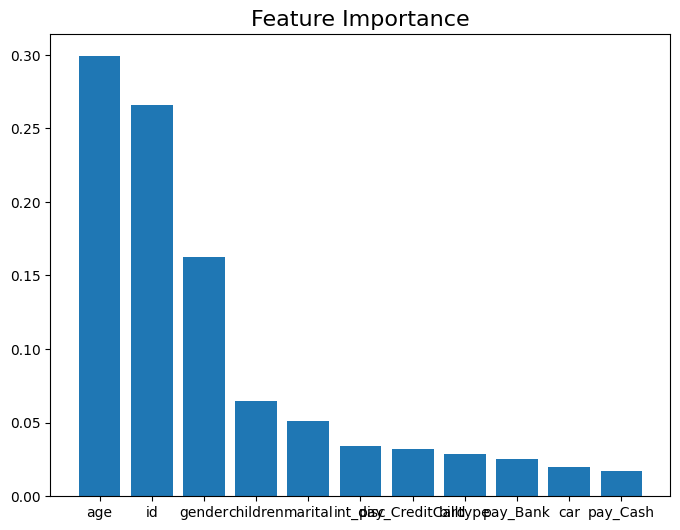

In [83]:
plt.figure(figsize=(8,6))
importances = churn_tree.feature_importances_
indices = np.argsort(importances)[::-1]
plt.bar(X_train.columns[indices], importances[indices]) #average reduction in impurity resulting from splitting at each node of the tree using that feature
plt.title('Feature Importance', fontsize=16);

There are different Pruning Parameters:

 - max_leaf_nodes: Reduce the number of leaf nodes
 - min_samples_leaf: Restrict the size of sample leaf. Minimum sample size in terminal nodes can be fixed to a number or a % of total 
 - max_depth: Reduce the depth of the tree to build a generalized tree. Set the depth of the tree to different values depending after verification on test data
 - etc..

In [84]:
from sklearn.model_selection import GridSearchCV

param_grid = {'max_depth': range(1,16)} # 15 different depth levels

churn_tree_pruned_cv = GridSearchCV(churn_tree, 
                   param_grid,
                   scoring='accuracy',
                   cv=5 , n_jobs=1, verbose=1)

churn_tree_pruned_cv.fit(X_train,Y_train);

Fitting 5 folds for each of 15 candidates, totalling 75 fits


In [85]:
print("Best parameters set found on development set:")
print()
print(churn_tree_pruned_cv.best_params_)
print()
print("Grid scores on development set:")
print()
means = churn_tree_pruned_cv.cv_results_['mean_test_score']
stds = churn_tree_pruned_cv.cv_results_['std_test_score']
for mean, std, params in zip(means, stds, churn_tree_pruned_cv.cv_results_['params']):
    print("Accuracy = %0.3f (+/%0.03f) for %r" % (mean, std * 2, params))

Best parameters set found on development set:

{'max_depth': 6}

Grid scores on development set:

Accuracy = 0.727 (+/0.029) for {'max_depth': 1}
Accuracy = 0.765 (+/0.024) for {'max_depth': 2}
Accuracy = 0.767 (+/0.034) for {'max_depth': 3}
Accuracy = 0.767 (+/0.025) for {'max_depth': 4}
Accuracy = 0.772 (+/0.029) for {'max_depth': 5}
Accuracy = 0.774 (+/0.033) for {'max_depth': 6}
Accuracy = 0.772 (+/0.018) for {'max_depth': 7}
Accuracy = 0.759 (+/0.026) for {'max_depth': 8}
Accuracy = 0.753 (+/0.040) for {'max_depth': 9}
Accuracy = 0.748 (+/0.028) for {'max_depth': 10}
Accuracy = 0.751 (+/0.040) for {'max_depth': 11}
Accuracy = 0.739 (+/0.029) for {'max_depth': 12}
Accuracy = 0.731 (+/0.050) for {'max_depth': 13}
Accuracy = 0.728 (+/0.037) for {'max_depth': 14}
Accuracy = 0.730 (+/0.037) for {'max_depth': 15}


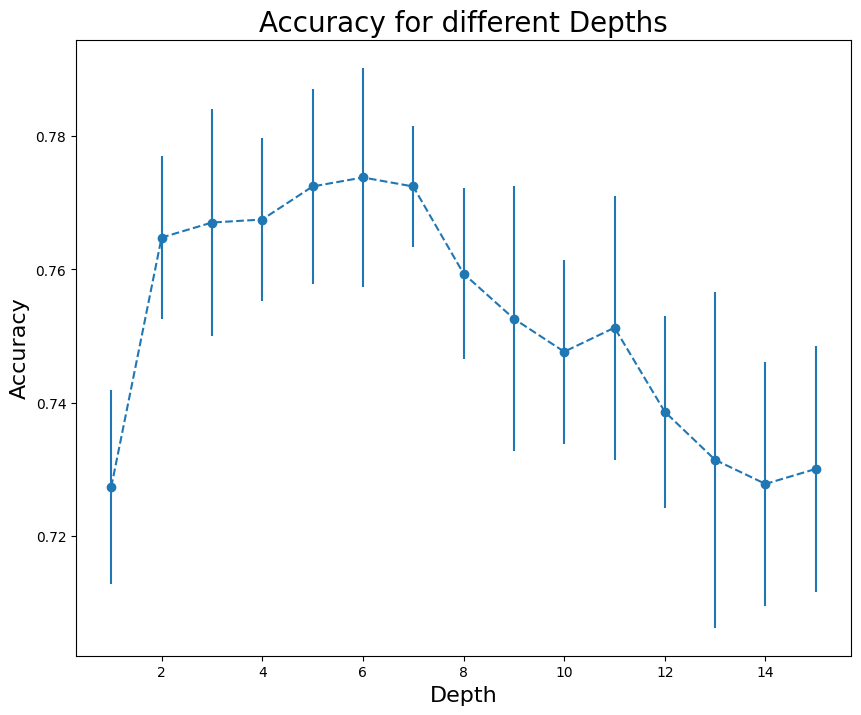

In [86]:
plt.figure(figsize=(10,8))
plt.errorbar(range(1,16,1), [m for m in means], yerr=stds, fmt='--o')
plt.title('Accuracy for different Depths', fontsize=20)
plt.xlabel("Depth", fontsize=16)
plt.ylabel("Accuracy", fontsize=16);

In [87]:
churn_tree_pruned = DecisionTreeClassifier(random_state=42, max_depth=6) 
tree = churn_tree_pruned.fit(X_train, Y_train)

predictions_test = churn_tree_pruned.predict(X_test) # obtains predictions with a threshold=50%
print("Accuracy = {0:.2%}".format(accuracy_score(Y_test, predictions_test)))

Accuracy = 77.26%


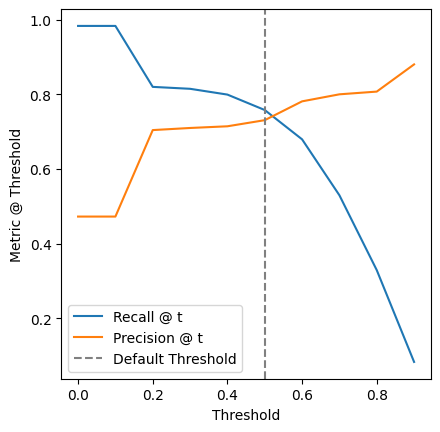

In [90]:
prob_pred = tree.predict_proba(X_test)[:, 1]
thresholds = np.arange(0.0, 1.0, step=0.1)
recall_scores = [metrics.recall_score(Y_test, prob_pred > t) for t in thresholds]
precis_scores = [metrics.precision_score(Y_test, prob_pred > t) for t in thresholds]

fig, ax = plt.subplots(1, 1)
ax.plot(thresholds, recall_scores, label="Recall @ t")
ax.plot(thresholds, precis_scores, label="Precision @ t")
ax.axvline(0.5, c="gray", linestyle="--", label="Default Threshold")
ax.set_xlabel("Threshold")
ax.set_ylabel("Metric @ Threshold")
ax.set_box_aspect(1)
ax.legend()
plt.show()

In [91]:
# How many nodes and leaves?
print("Number of nodes: ", churn_tree_pruned.tree_.node_count)
print("Number of leaves: ", churn_tree_pruned.get_n_leaves())

Number of nodes:  109
Number of leaves:  55


In [92]:
from sklearn import tree

text_representation = tree.export_text(churn_tree_pruned, feature_names=list(X_test.columns))
print(text_representation)

# optionally, we can export them to a text file
with open("titanic_pruned.log", "w") as fout:
    fout.write(text_representation)

|--- gender <= 0.50
|   |--- age <= 28.50
|   |   |--- car <= 0.50
|   |   |   |--- id <= 626.00
|   |   |   |   |--- age <= 25.50
|   |   |   |   |   |--- id <= 181.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- id >  181.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- age >  25.50
|   |   |   |   |   |--- pay_CreditCard <= 0.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- pay_CreditCard >  0.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- id >  626.00
|   |   |   |   |--- billtype <= 0.50
|   |   |   |   |   |--- children <= 0.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- children >  0.50
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- billtype >  0.50
|   |   |   |   |   |--- age <= 21.50
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- age >  21.50
|   |   |   |   |   |   |--- class: 1
|   |   |--- car >  0.50
|   |   |   |--- pay_CreditCard <= 0.50
|   |   |   |   |--- age <= 

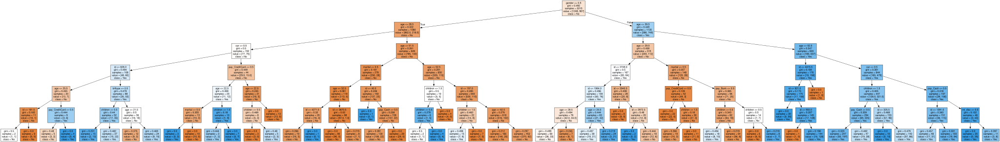

In [93]:
import graphviz
# DOT data
dot_data = tree.export_graphviz(churn_tree_pruned, out_file=None, 
                                class_names=["No","Yes"],
                                feature_names=X_train.columns,  
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [ ]:
# Save it into a high resolution image
graph.render("../OUTPUT/churn_pruned")

'..\\DATA\\churn_pruned.png'

c:\Users\SLO\Documents\GitHub\IE-University\myenv312\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspe

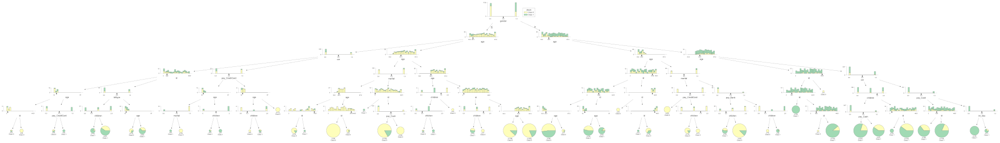

In [95]:
import dtreeviz

viz_cmodel = dtreeviz.model(churn_tree_pruned,
                           X_train=X_train,
                           y_train=Y_train,
                           feature_names=X_train.columns,
                           target_name='churn')

viz_cmodel.view(scale=1.5)

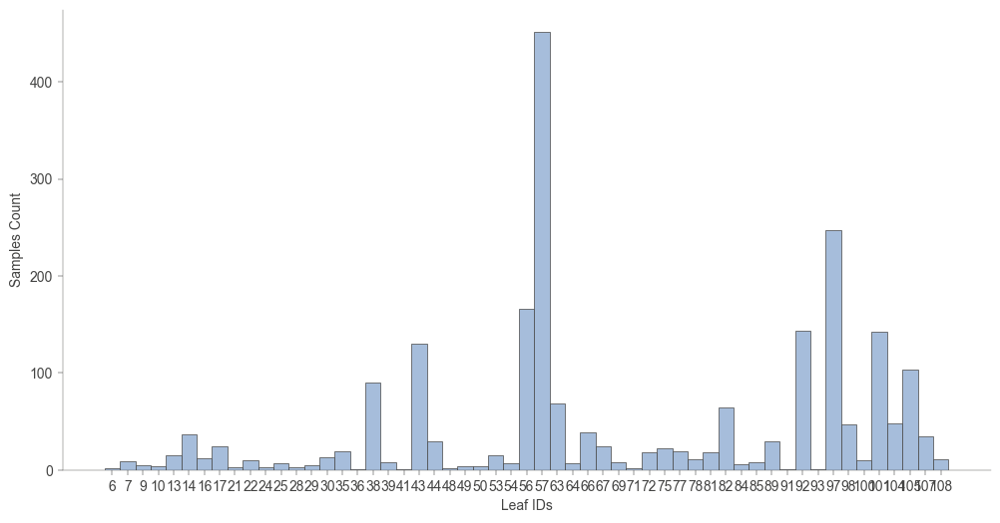

In [96]:
viz_cmodel.leaf_sizes(figsize=(12,6))

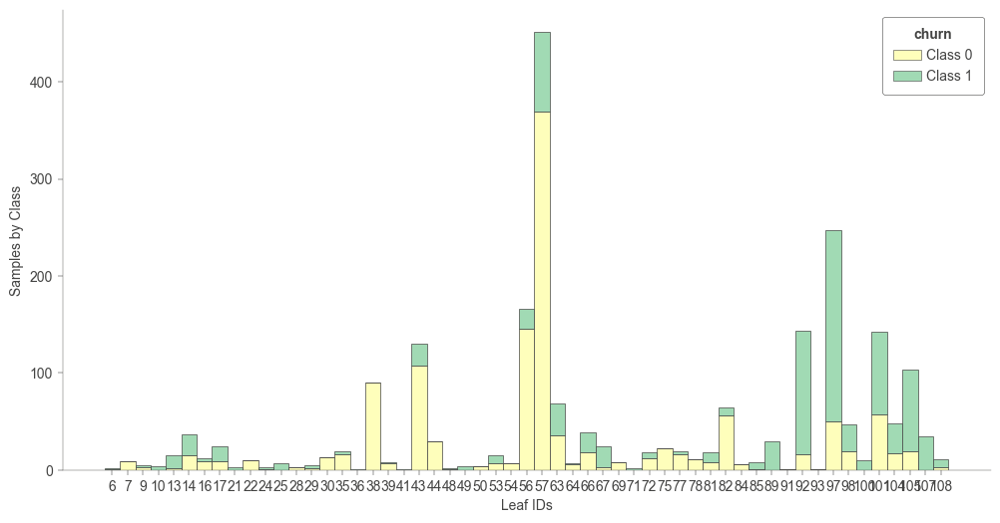

In [97]:
# Compare it with target classes
viz_cmodel.ctree_leaf_distributions(figsize=(12,6))

In [98]:
tree = churn_tree_pruned.tree_
node_samples = tree.n_node_samples
terminal_nodes = [i for i in range(tree.node_count) if tree.children_left[i] == tree.children_right[i]] # terminal nodes: those with no children
max_samples_terminal_node = max(terminal_nodes, key=lambda node: node_samples[node])
print(f"Terminal node with max frequency is {max_samples_terminal_node} with {node_samples[max_samples_terminal_node]} samples.")

Terminal node with max frequency is 57 with 452 samples.


In [99]:
viz_cmodel.node_stats(node_id=max_samples_terminal_node)

,id,int_disc,billtype,age,gender,marital,children,car,pay_Bank,pay_CreditCard,pay_Cash
count,452.0,452.0,452.0,452.0,452.0,452.0,452.0,452.0,452.0,452.0,452.0
mean,2338.042035,0.300885,0.484513,80.362832,0.0,0.619469,0.882743,0.336283,0.230088,0.54646,0.223451
std,1216.655313,0.459151,0.500314,10.608796,0.0,0.486055,0.813938,0.472961,0.421356,0.498388,0.41702
min,213.0,0.0,0.0,63.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,1304.25,0.0,0.0,71.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,2368.0,0.0,0.0,80.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
75%,3404.25,1.0,1.0,90.0,0.0,1.0,2.0,1.0,0.0,1.0,0.0
max,4431.0,1.0,1.0,97.0,0.0,1.0,2.0,1.0,1.0,1.0,1.0


In [100]:
decision_paths = churn_tree_pruned.decision_path(X_train)

indices_in_terminal_node = [i for i in range(len(X_train)) if decision_paths[i, max_samples_terminal_node] == 1]
node = indices_in_terminal_node[0]

c:\Users\SLO\Documents\GitHub\IE-University\myenv312\Lib\site-packages\dtreeviz\models\shadow_decision_tree.py:335: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
c:\Users\SLO\Documents\GitHub\IE-University\myenv312\Lib\site-packages\dtreeviz\trees.py:1231: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limits.
Ignoring fixed x limits to fulfill fixed data aspect with adjustable data limit

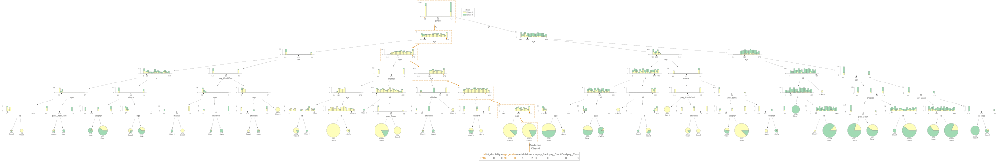

In [101]:
x = X_train.iloc[node]
viz_cmodel.view(x=x, scale=1.5)

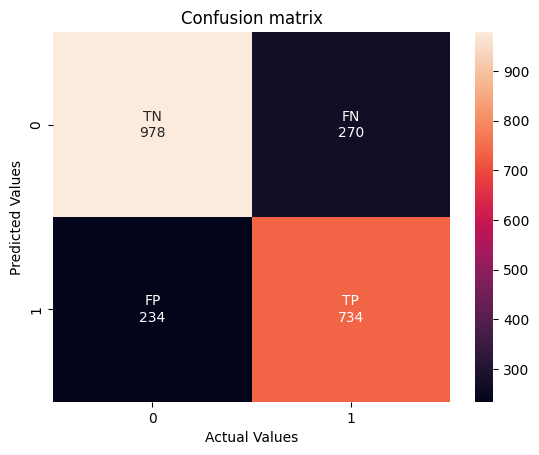

In [102]:
conf_mat = confusion_matrix(Y_test, predictions_test)

fig, ax = plt.subplots()
label_names = ['TN','FN','FP','TP']
label_counts = ['{0:0.0f}'.format(value) for value in conf_mat.flatten()]
labels = [f'{v1}\n{v2}' for v1, v2 in zip(label_names,label_counts)]
labels = np.asarray(labels).reshape(2,2)

# Draw heatmap using confusion matrix
sns.heatmap(conf_mat, annot=labels, fmt='')
ax.set_title('Confusion matrix')
ax.set_xlabel('Actual Values')
ax.set_ylabel('Predicted Values');

Threshold óptimo: 0.33


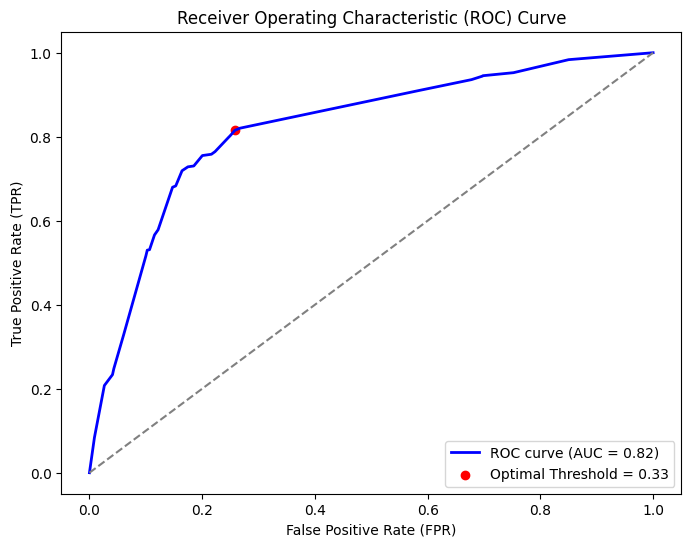

In [103]:
fpr, tpr, thresholds = roc_curve(Y_test, prob_pred)
roc_auc = auc(fpr, tpr)  
optimal_idx = np.argmax(tpr - fpr)  # Best trade-off between TPR and FPR
optimal_threshold = thresholds[optimal_idx]
print(f"Threshold óptimo: {optimal_threshold:.2f}")

# ROC curve
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')  # Random classification

# Highlight optimal threshold 
plt.scatter(fpr[optimal_idx], tpr[optimal_idx], color='red', marker='o',
            label=f'Optimal Threshold = {optimal_threshold:.2f}')

plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show() 